In [459]:
import requests
from bs4 import BeautifulSoup

# List of URLs to scrape
urls = [
    "https://fbref.com/en/comps/678/schedule/UEFA-Euro-Qualifying-Scores-and-Fixtures",
    "https://fbref.com/en/comps/218/schedule/Friendlies-M-Scores-and-Fixtures"
]

# List to store match report links
match_report_links = []

# Function to scrape match report links from a given URL
def scrape_match_reports(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.content, 'html.parser')
    
    # Try to find the table with either ID
    table = soup.find('table', id='sched_all') or soup.find('table', id='sched_2024_218_1')
    
    # Check if the table exists
    if table:
        rows = table.find_all('tr')
        
        # Loop through each row and extract the match report link
        for row in rows:
            match_report_cell = row.find('td', attrs={'data-stat': 'match_report'})
            if match_report_cell:
                link = match_report_cell.find('a', href=True)
                if link:
                    match_report_links.append("https://fbref.com" + link['href'])
    else:
        print(f"Table not found for URL: {url}")

# Loop through each URL and scrape match report links
for url in urls:
    scrape_match_reports(url)

# Print all match report links
for link in match_report_links:
    print(link)

# Save the links to a file
with open('match_report_links.txt', 'w') as f:
    for link in match_report_links:
        f.write(f"{link}\n")


https://fbref.com/en/matches/f4700be9/Portugal-Liechtenstein-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/287ad346/Denmark-Finland-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/537f08be/Bosnia-and-Herzegovina-Iceland-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/64af7b32/Italy-England-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/82c9473a/San-Marino-Northern-Ireland-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/882573bd/Slovakia-Luxembourg-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/b0a5ae97/North-Macedonia-Malta-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/2ecc3d6b/Kazakhstan-Slovenia-March-23-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/1e454af1/Bulgaria-Montenegro-March-24-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/e3779236/Gibraltar-Greece-March-24-2023-UEFA-Euro-Qualifying
https://fbref.com/en/matches/18788178/Austria-Azerbaijan-Ma

In [464]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time

# Read match report links from a file
with open('data/match_report_links.txt', 'r') as file:
    match_report_links = file.readlines()

# List to store data for all players
all_players_data = []

# Function to extract player statistics from a table
def extract_player_stats(table):
    players_data = []
    rows = table.find('tbody').find_all('tr')
    print(f"Found {len(rows)} rows in the table.")
    for row in rows:
        player_data = {}
        player_data['name'] = row.find('th', {'data-stat': 'player'}).text.strip()
        player_data['pos'] = row.find('td', {'data-stat': 'position'}).text.strip() if row.find('td', {'data-stat': 'position'}) else 'GK'
        player_data['minutes'] = row.find('td', {'data-stat': 'minutes'}).text.strip()
        player_data['goals'] = row.find('td', {'data-stat': 'goals'}).text.strip() if row.find('td', {'data-stat': 'goals'}) else '0'
        player_data['assists'] = row.find('td', {'data-stat': 'assists'}).text.strip() if row.find('td', {'data-stat': 'assists'}) else '0'
        player_data['pens_made'] = row.find('td', {'data-stat': 'pens_made'}).text.strip() if row.find('td', {'data-stat': 'pens_made'}) else '0'
        player_data['pens_att'] = row.find('td', {'data-stat': 'pens_att'}).text.strip() if row.find('td', {'data-stat': 'pens_att'}) else '0'
        player_data['shots'] = row.find('td', {'data-stat': 'shots'}).text.strip() if row.find('td', {'data-stat': 'shots'}) else '0'
        player_data['shots_on_target'] = row.find('td', {'data-stat': 'shots_on_target'}).text.strip() if row.find('td', {'data-stat': 'shots_on_target'}) else '0'
        player_data['cards_yellow'] = row.find('td', {'data-stat': 'cards_yellow'}).text.strip() if row.find('td', {'data-stat': 'cards_yellow'}) else '0'
        player_data['cards_red'] = row.find('td', {'data-stat': 'cards_red'}).text.strip() if row.find('td', {'data-stat': 'cards_red'}) else '0'
        player_data['fouls'] = row.find('td', {'data-stat': 'fouls'}).text.strip() if row.find('td', {'data-stat': 'fouls'}) else '0'
        player_data['fouled'] = row.find('td', {'data-stat': 'fouled'}).text.strip() if row.find('td', {'data-stat': 'fouled'}) else '0'
        player_data['offsides'] = row.find('td', {'data-stat': 'offsides'}).text.strip() if row.find('td', {'data-stat': 'offsides'}) else '0'
        player_data['crosses'] = row.find('td', {'data-stat': 'crosses'}).text.strip() if row.find('td', {'data-stat': 'crosses'}) else '0'
        player_data['tackles_won'] = row.find('td', {'data-stat': 'tackles_won'}).text.strip() if row.find('td', {'data-stat': 'tackles_won'}) else '0'
        player_data['interceptions'] = row.find('td', {'data-stat': 'interceptions'}).text.strip() if row.find('td', {'data-stat': 'interceptions'}) else '0'
        player_data['own_goals'] = row.find('td', {'data-stat': 'own_goals'}).text.strip() if row.find('td', {'data-stat': 'own_goals'}) else '0'
        player_data['pens_won'] = row.find('td', {'data-stat': 'pens_won'}).text.strip() if row.find('td', {'data-stat': 'pens_won'}) else '0'
        player_data['pens_conceded'] = row.find('td', {'data-stat': 'pens_conceded'}).text.strip() if row.find('td', {'data-stat': 'pens_conceded'}) else '0'
        players_data.append(player_data)
        print(f"Extracted data for player: {player_data['name']}")
    return players_data

# Function to extract goalkeeper statistics from a table
def extract_goalkeeper_stats(table):
    goalkeepers_data = []
    rows = table.find('tbody').find_all('tr')
    print(f"Found {len(rows)} rows in the goalkeeper table.")
    for row in rows:
        gk_data = {}
        gk_data['name'] = row.find('th', {'data-stat': 'player'}).text.strip()
        gk_data['pos'] = 'GK'
        gk_data['minutes'] = row.find('td', {'data-stat': 'minutes'}).text.strip()
        gk_data['shots_on_target_against'] = row.find('td', {'data-stat': 'gk_shots_on_target_against'}).text.strip()
        gk_data['goals_against'] = row.find('td', {'data-stat': 'gk_goals_against'}).text.strip()
        gk_data['saves'] = row.find('td', {'data-stat': 'gk_saves'}).text.strip()
        gk_data['save%'] = row.find('td', {'data-stat': 'gk_save_pct'}).text.strip() if row.find('td', {'data-stat': 'gk_save_pct'}) else '0'
        goalkeepers_data.append(gk_data)
        print(f"Extracted data for goalkeeper: {gk_data['name']}")
    return goalkeepers_data

# Function to merge player and goalkeeper statistics by aggregating data
def merge_stats(all_players_data, new_data):
    for new_player in new_data:
            all_players_data.append(new_player)

# Loop through each match report link
for match_report_link in match_report_links:
    match_report_link = match_report_link.strip()
    print(f"Processing match report: {match_report_link}")
    
    # Fetch the match report page
    response = requests.get(match_report_link)
    soup = BeautifulSoup(response.content, 'html.parser')

    # Print initial HTML for debugging
    print(soup.prettify())
    
    # Find all tables on the page
    tables = soup.find_all('table')

    # Extract player and goalkeeper statistics from each table
    for table in tables:
        if table.find('caption') and 'Player Stats Table' in table.find('caption').text:
            players_data = extract_player_stats(table)
            merge_stats(all_players_data, players_data)
        elif table.find('caption') and 'goalkeeper stats' in table.find('caption').text.lower():
            goalkeepers_data = extract_goalkeeper_stats(table)
            merge_stats(all_players_data, goalkeepers_data)
        else:
            print("Relevant table not found")
    
    # Delay before processing the next link
    time.sleep(6)

# Create DataFrame from the combined data
df_players = pd.DataFrame(all_players_data)

# Print column names for debugging
print("Column names in DataFrame:", df_players.columns.tolist())

# Clean up data (convert numerical columns from strings to integers)
numerical_columns = ['minutes', 'goals', 'assists', 'pens_made', 'pens_att', 'shots', 'shots_on_target', 'cards_yellow', 'cards_red', 'fouls', 'fouled', 'offsides', 'crosses', 'tackles_won', 'interceptions', 'own_goals', 'pens_won', 'pens_conceded', 'shots_on_target_against', 'goals_against', 'saves', 'save%']
for column in numerical_columns:
    if column in df_players.columns:
        df_players[column] = pd.to_numeric(df_players[column], errors='coerce').fillna(0).astype(int)
    else:
        print(f"Column {column} is missing in the DataFrame.")

# Save the DataFrame to a CSV file
df_players.to_csv('players_stats.csv', index=False)

# Display the first few rows of the DataFrame
print(df_players.head())


Processing match report: https://fbref.com/en/matches/f4700be9/Portugal-Liechtenstein-March-23-2023-UEFA-Euro-Qualifying
<!DOCTYPE html>
<html class="no-js" data-root="/home/fb/deploy/www/base" data-version="klecko-" lang="en">
 <head>
  <meta charset="utf-8"/>
  <meta content="ie=edge" http-equiv="x-ua-compatible"/>
  <meta content="width=device-width, initial-scale=1.0, maximum-scale=2.0" name="viewport">
   <link href="https://cdn.ssref.net/req/202406031" rel="dns-prefetch"/>
   <!-- yes-inmobi-ssi -->
   <!-- InMobi Choice. Consent Manager Tag v3.0 (for TCF 2.2) -->
   <script async="true" type="text/javascript">
    (function() {
  var host = window.location.hostname;
  var element = document.createElement('script');
  var firstScript = document.getElementsByTagName('script')[0];
  var url = 'https://cmp.inmobi.com'
    .concat('/choice/', 'XwNYEpNeFfhfr', '/', host, '/choice.js?tag_version=V3');
  var uspTries = 0;
  var uspTriesLimit = 3;
  element.async = true;
  element.type =

In [428]:
import pandas as pd
import soccerdata as sd

# Extract data from FBRef
fbref = sd.FBref(leagues="Big 5 European Leagues Combined", seasons="2023-2024")

# Get player season statistics
player_season_stats = fbref.read_player_season_stats(stat_type="standard")
df_stats = pd.DataFrame(player_season_stats).reset_index()
df_stats.columns = [' '.join(col).strip() for col in df_stats.columns.values]
df_stats.rename(columns={'player': 'name'}, inplace=True)
df_stats['name'] = df_stats['name'].str.strip().str.title()

# Load manually created player stats
df_manual_stats = pd.read_csv(r'players_stats.csv')  # Adjust the path as needed

# Ensure the name columns are consistent in case of any discrepancies
df_manual_stats['name'] = df_manual_stats['name'].str.strip().str.title()

# Handle save% as a percentage
if 'save%' in df_manual_stats.columns:
    # Convert the column to string first if it's not already
    df_manual_stats['save%'] = df_manual_stats['save%'].astype(str)
    # Remove '%' and convert to float
    df_manual_stats['save%'] = df_manual_stats['save%'].str.rstrip('%').astype('float') / 100.0

# Merge the dataframes on the player names
df_combined = pd.merge(df_stats, df_manual_stats, on='name', how='inner')

# Export the merged dataframe to a new CSV file
df_combined.to_csv('combined_player_stats.csv', index=False)  # Adjust the path as needed

print("Data extraction and merging complete. Combined data saved to 'combined_player_stats.csv'.")


[06/05/24 20:27:28] INFO     Saving cached data to C:\Users\Kasper\soccerdata\data\FBref              ]8;id=350260;file://c:\Users\Kasper\AppData\Local\Programs\Python\Python312\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=253077;file://c:\Users\Kasper\AppData\Local\Programs\Python\Python312\Lib\site-packages\soccerdata\_common.py#92\92]8;;\

Data extraction and merging complete. Combined data saved to 'combined_player_stats.csv'.


In [429]:
import pandas as pd

# Load the data into a pandas DataFrame
data = pd.read_csv(r'combined_player_stats.csv')

# Fill missing values with 0
data = data.fillna(0)

# Ensure 'save%' is converted to float and handled properly
if 'save%' in data.columns:
    data['save%'] = data['save%'].astype(str).str.rstrip('%').astype(float) / 100.0

# Function to calculate weighted average
def weighted_avg(group, avg_name, weight_name):
    d = group[avg_name]
    w = group[weight_name]
    return (d * w).sum() / w.sum()

# Calculate the save percentage correctly using the weighted average
if 'save%' in data.columns:
    save_pct_weighted_avg = data.groupby('name').apply(lambda x: weighted_avg(x, 'save%', 'minutes')).reset_index()
    save_pct_weighted_avg.columns = ['name', 'save%']
    save_pct_weighted_avg['save%'] = save_pct_weighted_avg['save%'] * 100  # Convert back to percentage for output

# Aggregate the data by summing the numeric columns for each player
numeric_columns = data.select_dtypes(include=['number']).columns.tolist()
numeric_columns.remove('save%')
aggregated_data = data.groupby('name')[numeric_columns].sum(numeric_only=True).reset_index()

# Merge the save% weighted average back into the aggregated data
if 'save%' in aggregated_data.columns:
    aggregated_data = aggregated_data.drop(columns=['save%'])
aggregated_data = pd.merge(aggregated_data, save_pct_weighted_avg, on='name', how='left')

# For non-numeric columns, we'll take the unique values each player has been listed with
non_numeric_columns = data.select_dtypes(exclude=['number']).columns.tolist()
non_numeric_columns.remove('name')
for col in non_numeric_columns:
    unique_values = data.groupby('name')[col].apply(lambda x: ','.join(set(x.astype(str)))).reset_index()
    aggregated_data = pd.merge(aggregated_data, unique_values, on='name', how='left')

# Reorder columns to place 'pos' after 'name'
cols = ['name', 'pos', 'nation'] + [col for col in aggregated_data.columns if col not in ['name', 'pos', 'nation']]
aggregated_data = aggregated_data[cols]

# Order by minutes
aggregated_data = aggregated_data.sort_values(by='minutes', ascending=False)

# Save the aggregated data to a new CSV file
aggregated_data.to_csv(r'data\aggregated_player_stats.csv', index=False)

print("Data aggregation complete. Aggregated data saved to 'data/aggregated_player_stats.csv'.")


C:\Users\Kasper\AppData\Local\Temp\ipykernel_3124\4164281621.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  save_pct_weighted_avg = data.groupby('name').apply(lambda x: weighted_avg(x, 'save%', 'minutes')).reset_index()


KeyError: "['pos'] not in index"

In [382]:
#Any extra data collected after initial scrape, can be appended here.

import pandas as pd

# Load existing aggregated data
existing_data = pd.read_csv(r'data\aggregated_player_stats.csv')

# Load new data from player_stats_friendlies.csv
new_data = pd.read_csv('player_stats_friendlies.csv')

# Fill missing values with 0
new_data = new_data.fillna(0)

# Concatenate existing data with new data
concatenated_data = pd.concat([existing_data, new_data])

# Aggregate the concatenated data to ensure no duplicates
aggregated_data = concatenated_data.groupby('name').sum(numeric_only=True).reset_index()

# For positions, take the unique positions each player has been listed as
positions = concatenated_data.groupby('name')['pos'].apply(lambda x: ','.join(set(x))).reset_index()

# Merge the aggregated numeric data with the unique positions
aggregated_data = pd.merge(aggregated_data, positions, on='name')

# Reorder columns to place 'pos' after 'name'
cols = ['name', 'pos'] + [col for col in aggregated_data.columns if col not in ['name', 'pos']]
aggregated_data = aggregated_data[cols]

# Order by minutes
aggregated_data = aggregated_data.sort_values(by='minutes', ascending=False)

# Save the aggregated data back to CSV
aggregated_data.to_csv(r'data\aggregated_player_stats.csv', index=False)


FileNotFoundError: [Errno 2] No such file or directory: 'player_stats_friendlies.csv'

In [13]:
import pandas as pd
from pulp import LpMaximize, LpProblem, LpVariable, lpSum
import re


match_odds = {
    'GER_Round1': {'win': 1.27, 'draw': 5.89, 'lose': 11.06},
    'SCO_Round1': {'win': 11.06, 'draw': 5.89, 'lose': 1.27},
    'HUN_Round1': {'win': 3.57, 'draw': 3.33, 'lose': 2.16},
    'SUI_Round1': {'win': 2.16, 'draw': 3.33, 'lose': 3.57},
    'ESP_Round1': {'win': 1.79, 'draw': 3.63, 'lose': 4.75},
    'CRO_Round1': {'win': 4.75, 'draw': 3.63, 'lose': 1.79},
    'ITA_Round1': {'win': 1.37, 'draw': 4.73, 'lose': 9.34},
    'ALB_Round1': {'win': 9.34, 'draw': 4.73, 'lose': 1.37},
    'POL_Round1': {'win': 5.08, 'draw': 3.98, 'lose': 1.68},
    'NED_Round1': {'win': 1.68, 'draw': 3.98, 'lose': 5.08},
    'SVN_Round1': {'win': 5.10, 'draw': 3.61, 'lose': 1.74},
    'DEN_Round1': {'win': 1.74, 'draw': 3.61, 'lose': 5.10},
    'SRB_Round1': {'win': 6.95, 'draw': 4.45, 'lose': 1.47},
    'ENG_Round1': {'win': 1.47, 'draw': 4.45, 'lose': 6.95},
    'ROU_Round1': {'win': 3.65, 'draw': 3.46, 'lose': 2.08},
    'UKR_Round1': {'win': 2.08, 'draw': 3.46, 'lose': 3.65},
    'BEL_Round1': {'win': 1.48, 'draw': 4.49, 'lose': 6.72},
    'SVK_Round1': {'win': 6.72, 'draw': 4.49, 'lose': 1.48},
    'AUT_Round1': {'win': 6.47, 'draw': 4.53, 'lose': 1.49},
    'FRA_Round1': {'win': 1.49, 'draw': 4.53, 'lose': 6.47},
    'TUR_Round1': {'win': 1.79, 'draw': 3.61, 'lose': 4.77},
    'GEO_Round1': {'win': 4.77, 'draw': 3.61, 'lose': 1.79},
    'POR_Round1': {'win': 1.55, 'draw': 4.23, 'lose': 6.16},
    'CZE_Round1': {'win': 6.16, 'draw': 4.23, 'lose': 1.55},

    'CRO_Round2': {'win': 1.56, 'draw': 4.07, 'lose': 6.26},
    'ALB_Round2': {'win': 6.26, 'draw': 4.07, 'lose': 1.56},
    'GER_Round2': {'win': 1.31, 'draw': 5.42, 'lose': 9.69},
    'HUN_Round2': {'win': 9.69, 'draw': 5.42, 'lose': 1.31},
    'SCO_Round2': {'win': 3.43, 'draw': 3.40, 'lose': 2.17},
    'SUI_Round2': {'win': 2.17, 'draw': 3.40, 'lose': 3.43},
    'SVN_Round2': {'win': 3.93, 'draw': 3.47, 'lose': 1.98},
    'SRB_Round2': {'win': 1.98, 'draw': 3.47, 'lose': 3.93},
    'DEN_Round2': {'win': 5.66, 'draw': 3.91, 'lose': 1.63},
    'ENG_Round2': {'win': 1.63, 'draw': 3.91, 'lose': 5.66},
    'ESP_Round2': {'win': 2.30, 'draw': 3.30, 'lose': 3.25},
    'ITA_Round2': {'win': 3.25, 'draw': 3.30, 'lose': 2.30},
    'SVK_Round2': {'win': 4.02, 'draw': 3.42, 'lose': 1.98},
    'UKR_Round2': {'win': 1.98, 'draw': 3.42, 'lose': 4.02},
    'POL_Round2': {'win': 3.47, 'draw': 3.45, 'lose': 2.13},
    'AUT_Round2': {'win': 2.13, 'draw': 3.45, 'lose': 3.47},
    'NED_Round2': {'win': 4.55, 'draw': 3.80, 'lose': 1.77},
    'FRA_Round2': {'win': 1.77, 'draw': 3.80, 'lose': 4.55},
    'BEL_Round2': {'win': 1.52, 'draw': 4.32, 'lose': 6.24},
    'ROU_Round2': {'win': 6.24, 'draw': 4.32, 'lose': 1.52},
    'GEO_Round2': {'win': 4.71, 'draw': 3.63, 'lose': 1.79},
    'CZE_Round2': {'win': 1.79, 'draw': 3.63, 'lose': 4.71},
    'TUR_Round2': {'win': 5.11, 'draw': 3.99, 'lose': 1.67},
    'POR_Round2': {'win': 1.67, 'draw': 3.99, 'lose': 5.11},

    'SCO_Round3': {'win': 2.83, 'draw': 3.54, 'lose': 2.44},
    'HUN_Round3': {'win': 2.44, 'draw': 3.54, 'lose': 2.83},
    'SUI_Round3': {'win': 4.57, 'draw': 3.95, 'lose': 1.75},
    'GER_Round3': {'win': 1.75, 'draw': 3.95, 'lose': 4.57},
    'CRO_Round3': {'win': 3.61, 'draw': 3.66, 'lose': 2.02},
    'ITA_Round3': {'win': 2.02, 'draw': 3.66, 'lose': 3.61},
    'ALB_Round3': {'win': 12.00, 'draw': 5.60, 'lose': 1.27},
    'ESP_Round3': {'win': 1.27, 'draw': 5.60, 'lose': 12.00},
    'FRA_Round3': {'win': 1.38, 'draw': 5.05, 'lose': 8.15},
    'POL_Round3': {'win': 8.15, 'draw': 5.05, 'lose': 1.38},
    'NED_Round3': {'win': 2.16, 'draw': 3.69, 'lose': 3.19},
    'AUT_Round3': {'win': 3.19, 'draw': 3.69, 'lose': 2.16},
    'DEN_Round3': {'win': 2.38, 'draw': 3.43, 'lose': 2.86},
    'SRB_Round3': {'win': 2.86, 'draw': 3.43, 'lose': 2.38},
    'ENG_Round3': {'win': 1.34, 'draw': 5.05, 'lose': 8.60},
    'SVN_Round3': {'win': 8.60, 'draw': 5.05, 'lose': 1.34},
    'SVK_Round3': {'win': 2.72, 'draw': 3.18, 'lose': 2.75},
    'ROU_Round3': {'win': 2.75, 'draw': 3.18, 'lose': 2.72},
    'UKR_Round3': {'win': 4.41, 'draw': 3.86, 'lose': 1.79},
    'BEL_Round3': {'win': 1.79, 'draw': 3.86, 'lose': 4.41},
    'GEO_Round3': {'win': 10.29, 'draw': 5.89, 'lose': 1.29},
    'POR_Round3': {'win': 1.29, 'draw': 5.89, 'lose': 10.29},
    'CZE_Round3': {'win': 3.03, 'draw': 3.33, 'lose': 2.44},
    'TUR_Round3': {'win': 2.44, 'draw': 3.33, 'lose': 3.03}
}


# Round 1 Matches
round1_matches = [
    ("Germany", "Scotland"),
    ("Hungary", "Switzerland"),
    ("Spain", "Croatia"),
    ("Italy", "Albania"),
    ("Poland", "Holland"),
    ("Slovenia", "Denmark"),
    ("Serbia", "England"),
    ("Romania", "Ukraine"),
    ("Belgium", "Slovakia"),
    ("Austria", "France"),
    ("Turkey", "Georgia"),
    ("Portugal", "Czech Republic")
]

round2_matches = [
    ("Croatia", "Albania"),
    ("Germany", "Hungary"),
    ("Scotland", "Switzerland"),
    ("Slovenia", "Serbia"),
    ("Denmark", "England"),
    ("Spain", "Italy"),
    ("Slovakia", "Ukraine"),
    ("Poland", "Austria"),
    ("Holland", "France"),
    ("Georgia", "Czech Republic"),
    ("Turkey", "Portugal"),
    ("Belgium", "Romania")
]


round3_matches = [
    ("Scotland", "Hungary"),
    ("Switzerland", "Germany"),
    ("Croatia", "Italy"),
    ("Albania", "Spain"),
    ("France", "Poland"),
    ("Holland", "Austria"),
    ("Denmark", "Serbia"),
    ("England", "Slovenia"),
    ("Slovakia", "Romania"),
    ("Ukraine", "Belgium"),
    ("Georgia", "Portugal"),
    ("Czech Republic", "Turkey")
]


# Define the mapping dictionary from ISO codes to team names used in match odds
iso_to_team = {
    'GER': 'Germany',
    'SCO': 'Scotland',
    'HUN': 'Hungary',
    'SUI': 'Switzerland',
    'ESP': 'Spain',
    'CRO': 'Croatia',
    'ITA': 'Italy',
    'ALB': 'Albania',
    'POL': 'Poland',
    'NED': 'Holland',
    'SVN': 'Slovenia',
    'DEN': 'Denmark',
    'SRB': 'Serbia',
    'ENG': 'England',
    'ROU': 'Romania',
    'UKR': 'Ukraine',
    'BEL': 'Belgium',
    'SVK': 'Slovakia',
    'AUT': 'Austria',
    'FRA': 'France',
    'TUR': 'Turkey',
    'GEO': 'Georgia',
    'POR': 'Portugal',
    'CZE': 'Czech Republic'
}

# Initial budget and increment per round
initial_budget = 50_000_000
budget_increment_per_round = 800_000

# Define a function to clean player names
def clean_name(name):
    return re.split(r'\n', name)[0].strip()

def print_team_matches(df, team_name):
    team_df = df[df['team'] == team_name].copy()
    print(f"Players for {team_name}:")
    print(team_df[['name', 'minutes']])
    team_df['matches'] = team_df['minutes'] / 90
    print(f"Total matches: {team_df['matches'].sum()}\n")


# Function to calculate fantasy score
def calculate_fantasy_score(df, match_difficulty=None, difficulty_weight=5):
    score = pd.Series(0, index=df.index)
    
    # Calculate total matches from minutes played
    df['matches'] = df['minutes'] / 90
    # Average stats per match
    df['avg_goals'] = df['Performance Gls'] / df['matches']
    df['avg_assists'] = df['Performance Ast'] / df['matches']
    df['avg_yellows'] = df['Performance CrdY'] / df['matches']
    df['avg_reds'] = df['Performance CrdR'] / df['matches']
    
    # Goals
    score += df['avg_goals'] * df['pos'].map({
        'FW': 125000, 
        'MF': 150000, 
        'DF': 175000, 
        'GK': 250000
    }).fillna(0)
    
    # Assists
    score += df['avg_assists'] * 60000
    
    # Yellow and Red Cards
    score -= df['avg_yellows'] * 20000
    score -= df['avg_reds'] * 50000

    # Goalkeeper specific statistics
    is_gk = df['pos'] == 'GK'
    score[is_gk] += df['saves'][is_gk] / df['matches'] * 5000
    score[is_gk] -= df['goals_against'][is_gk] / df['matches'] * 10000
    score[is_gk] += df['save%'][is_gk] * 75000 * 5

    
    # Adjust score based on match difficulty if provided
    if match_difficulty is not None:
        match_difficulty_series = df['team'].map(match_difficulty).fillna(1)
        score /= abs(match_difficulty_series) ** difficulty_weight


    
    # Weight score by the likelihood of starting
    average_matches = df.groupby('team')['matches'].transform('mean')
    weight = (df['matches'] / average_matches) * 5
    print(df['name'])
    print(df['matches'])

    score *= weight
    
    return score

# Function to calculate multipliers from odds
def calculate_multipliers(odds):
    probabilities = {key: 1 / value for key, value in odds.items()}
    total = sum(probabilities.values())
    normalized_probabilities = {key: value / total for key, value in probabilities.items()}
    return {key: 1 / value for key, value in normalized_probabilities.items()}

# Calculate match difficulty multipliers using mapped team names
match_difficulty = {iso_to_team[iso.split('_')[0]]: calculate_multipliers(odds)['win'] for iso, odds in match_odds.items()}

# Function to optimize the team
def optimize_team(df, formation, budget=50_000_000):
    # Define the optimization problem
    prob = LpProblem("Fantasy_Team_Selection", LpMaximize)

    # Define decision variables
    player_vars = LpVariable.dicts("Player", df.index, cat='Binary')

    # Objective function: Maximize total fantasy score
    prob += lpSum([player_vars[i] * df.loc[i, 'fantasy_score_with_difficulty'] for i in df.index])

    # Constraint: Total cost should not exceed the budget
    prob += lpSum([player_vars[i] * df.loc[i, 'Price'] for i in df.index]) <= budget

    # Positional constraints
    for pos, count in formation.items():
        prob += lpSum([player_vars[i] for i in df.index if pos in df.loc[i, 'pos']]) == count

    # Nationality constraint: No more than 4 players from the same nation
    for nation in df['nation'].unique():
        prob += lpSum([player_vars[i] for i in df.index if df.loc[i, 'nation'] == nation]) <= 4

    # Constraint: Exactly 11 players must be selected
    prob += lpSum(player_vars[i] for i in df.index) == 11

    # Constraint: Minimum player score of 200k
    prob += lpSum([player_vars[i] * (df.loc[i, 'fantasy_score_with_difficulty'] >= 200000) for i in df.index]) == 11

    # Solve the optimization problem
    prob.solve()

    # Extract the selected team
    selected_team = df[[player_vars[i].varValue == 1 for i in df.index]]
    
    return selected_team if not selected_team.empty else None


# Load and clean data
df_prices = pd.read_csv(r'data\cleaned_player_prices.csv')
df_prices['name'] = df_prices['name'].apply(clean_name).str.strip().str.title()

# Initialize FBRef data source for the Big 5 European Leagues combined
import soccerdata as sd
fbref = sd.FBref(leagues="Big 5 European Leagues Combined", seasons="2023-2024")

# Get player season statistics
player_season_stats = fbref.read_player_season_stats(stat_type="standard")
df_stats = pd.DataFrame(player_season_stats).reset_index()
df_stats.columns = [' '.join(col).strip() for col in df_stats.columns.values]
df_stats.rename(columns={'player': 'name'}, inplace=True)
df_stats['name'] = df_stats['name'].str.strip().str.title()

# Define the list of nationalities to include
nationalities_to_include = list(iso_to_team.keys())
df_stats = df_stats[df_stats['nation'].isin(nationalities_to_include)]

# Load Euro Qualifying data
df_qualifying = pd.read_csv(r'data\aggregated_player_stats.csv')
df_qualifying['name'] = df_qualifying['name'].apply(clean_name).str.strip().str.title()

# Merge dataframes
df_combined = pd.merge(df_stats, df_qualifying[['name', 'minutes', 'saves', 'goals_against', 'save%']], on='name', how='inner')
df_combined = pd.merge(df_combined, df_prices, on='name', how='inner')

# Add team names based on nation codes
df_combined['team'] = df_combined['nation'].map(iso_to_team)

# Enforce specific position rules
position_corrections = {
    'Antoine Griezmann': 'FW',
    'Kingsley Coman': 'FW',
    'Yannick Carrasco': 'MF',
    'Cengiz Ünder': '',
    'Oleksandr Zinchenko': 'MF',
    'Ollie Watkins': '',
    'Pedro Porro': '',
    'James Maddison': 'FW',
    'Saba Sazonov': 'FW',
    'Etrit Berisha': '',
    'Thomas Strakosha': '',
    'Gerard Moreno': '',
    'Giorgi Mamardashvili': '',
    'Jude Bellingham': ''
}
df_combined.loc[df_combined['name'].isin(position_corrections.keys()), 'pos'] = df_combined['name'].map(position_corrections)

# Filter out players with empty positions
df_combined = df_combined[df_combined['pos'] != '']

# Update the fantasy score calculation to use the total minutes
df_combined['fantasy_score_with_difficulty'] = calculate_fantasy_score(df_combined, match_difficulty, difficulty_weight=5)
df_combined['fantasy_score_without_difficulty'] = calculate_fantasy_score(df_combined, match_difficulty=None, difficulty_weight=0)

df_combined['score_with_difficulty'] = df_combined['fantasy_score_with_difficulty'] / df_combined['Price']

# Define formations with their respective position requirements
formations = {
    '5-4-1': {'GK': 1, 'DF': 5, 'MF': 4, 'FW': 1},
    '5-3-2': {'GK': 1, 'DF': 5, 'MF': 3, 'FW': 2},
    '4-5-1': {'GK': 1, 'DF': 4, 'MF': 5, 'FW': 1},
    '4-4-2': {'GK': 1, 'DF': 4, 'MF': 4, 'FW': 2},
    '4-3-3': {'GK': 1, 'DF': 4, 'MF': 3, 'FW': 3},
    '3-5-2': {'GK': 1, 'DF': 3, 'MF': 5, 'FW': 2},
    '3-4-3': {'GK': 1, 'DF': 3, 'MF': 4, 'FW': 3}
}

# Calculate value per million
df_combined['value_per_million'] = df_combined['fantasy_score_with_difficulty'] / (df_combined['Price'] / 1_000_000)

# Function to simulate rounds and update player values
def simulate_rounds(df, formations, rounds=3, initial_budget=50_000_000):
    best_formations = []
    current_team = pd.DataFrame()
    current_team_names = []
    budget = initial_budget

    for round_number in range(1, rounds + 1):
        if round_number > 1:
            df['Price'] += df['fantasy_score_without_difficulty']

        if round_number > 1:
            df['transfer_cost'] = 0.01 * df['Price']
            for name in current_team_names:
                df.loc[df['name'] == name, 'transfer_cost'] = 0
        else:
            df['transfer_cost'] = 0

        df['effective_price'] = df['Price'] + df['transfer_cost']

        best_formation = None
        best_team = None
        best_score = 0

        for formation_name, formation in formations.items():
            optimized_team = optimize_team(df, formation, budget)
            if optimized_team is not None:
                total_score = optimized_team['fantasy_score_with_difficulty'].sum()
                if total_score > best_score:
                    best_formation = formation_name
                    best_team = optimized_team
                    best_score = total_score

        if best_team is None:
            print(f"No feasible solution found for round {round_number}.")
            continue

        if round_number > 1:
            replaced_players = current_team[~current_team['name'].isin(best_team['name'])]
            new_players = best_team[~best_team['name'].isin(current_team['name'])]
        else:
            replaced_players = best_team
            new_players = pd.DataFrame()

        valid_replacements = pd.DataFrame(columns=['name_out', 'name_in', 'reason'])
        used_replacements = set()

        if round_number > 1:
            for idx, player in replaced_players.iterrows():
                possible_replacements = new_players[new_players['pos'] == player['pos']]
                for _, replacement in possible_replacements.iterrows():
                    if replacement['team'] != player['team'] and replacement['name'] not in used_replacements:
                        print(f"Round {round_number} - Checking replacement for {player['name']} (Score: {player['fantasy_score_with_difficulty']}) with {replacement['name']} (Score: {replacement['fantasy_score_with_difficulty']})")
                        if replacement['fantasy_score_with_difficulty'] > player['fantasy_score_with_difficulty']:
                            reason = f"Replacing {player['name']} with {replacement['name']} due to higher fantasy score ({replacement['fantasy_score_with_difficulty']} vs {player['fantasy_score_with_difficulty']})."
                            valid_replacements = pd.concat([valid_replacements, pd.DataFrame([{'name_out': player['name'], 'name_in': replacement['name'], 'reason': reason}])])
                            used_replacements.add(replacement['name'])
                        break

        best_formations.append((round_number, best_formation, best_team, best_score, valid_replacements))

        current_team = best_team
        current_team_names = current_team['name'].tolist()

        if round_number == 1:
            budget += best_team['fantasy_score_without_difficulty'].sum()

    return best_formations

# Simulate 3 rounds
best_formations = simulate_rounds(df_combined, formations, rounds=3, initial_budget=initial_budget)

# Display results
for round_number, formation_name, team, score, valid_replacements in best_formations:
    print(f"Round: {round_number}, Formation: {formation_name}")
    if round_number == 1:
        print("Full Team:")
        print(team[['name', 'Price', 'fantasy_score_with_difficulty', 'value_per_million', 'pos', 'team', 'fantasy_score_without_difficulty']])
    else:
        print("Replacements:")
        if not valid_replacements.empty:
            for idx, replacement in valid_replacements.iterrows():
                print(f"Replace {replacement['name_out']} with {replacement['name_in']}")
                print(f"Reason: {replacement['reason']}")
        else:
            print("No replacements needed.")
    print(f"Total Fantasy Score: {score:.2f}")
    total_score_without_diff = team['fantasy_score_without_difficulty'].sum()
    print(f"Total Fantasy Score without match difficulty: {total_score_without_diff:.2f}")
    print("="*40)

# Save results to CSV
for round_number, formation_name, team, score, valid_replacements in best_formations:
    if round_number == 1:
        team[['name', 'Price', 'fantasy_score_with_difficulty', 'value_per_million', 'pos']].to_csv(f'optimized_team_round{round_number}_{formation_name}.csv', index=False)
    else:
        valid_replacements.to_csv(f'replacements_round{round_number}_{formation_name}.csv', index=False)


[06/07/24 14:23:44] INFO     Saving cached data to C:\Users\Kasper\soccerdata\data\FBref              ]8;id=838679;file://c:\Users\Kasper\AppData\Local\Programs\Python\Python312\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=676026;file://c:\Users\Kasper\AppData\Local\Programs\Python\Python312\Lib\site-packages\soccerdata\_common.py#92\92]8;;\

0          Bukayo Saka
1           David Raya
2          Declan Rice
3         Jakub Kiwior
4             Jorginho
            ...       
259         David Zima
260    Raoul Bellanova
261       Saba Sazonov
262         Jaka Bijol
263    Lazar Samardzic
Name: name, Length: 257, dtype: object
0       5.444444
1       3.000000
2       8.977778
3      10.333333
4       3.911111
         ...    
259     3.000000
260     0.500000
261     0.155556
262    11.844444
263     1.211111
Name: matches, Length: 257, dtype: float64
0          Bukayo Saka
1           David Raya
2          Declan Rice
3         Jakub Kiwior
4             Jorginho
            ...       
259         David Zima
260    Raoul Bellanova
261       Saba Sazonov
262         Jaka Bijol
263    Lazar Samardzic
Name: name, Length: 257, dtype: object
0       5.444444
1       3.000000
2       8.977778
3      10.333333
4       3.911111
         ...    
259     3.000000
260     0.500000
261     0.155556
262    11.844444
263     1.211111

In [445]:
# Sort the combined DataFrame by fantasy score in descending order
top_100_players = df_combined.sort_values(by='fantasy_score_with_difficulty', ascending=False).head(10000)

# Select required columns for display
top_100_players = top_100_players[['name', 'fantasy_score_with_difficulty', 'Price', 'nation']]

# Rename columns for clarity
top_100_players.columns = ['Player Name', 'Fantasy Score', 'Price', 'Nationality']

# Define the file name
file_name = "top_100_players.txt"

# Write the top 100 players to a text file
with open(file_name, 'w') as file:
    file.write("Top 100 Players:\n")
    file.write(top_100_players.to_string(index=False))

print(f"Top 100 players saved to {file_name}.")


Top 100 players saved to top_100_players.txt.


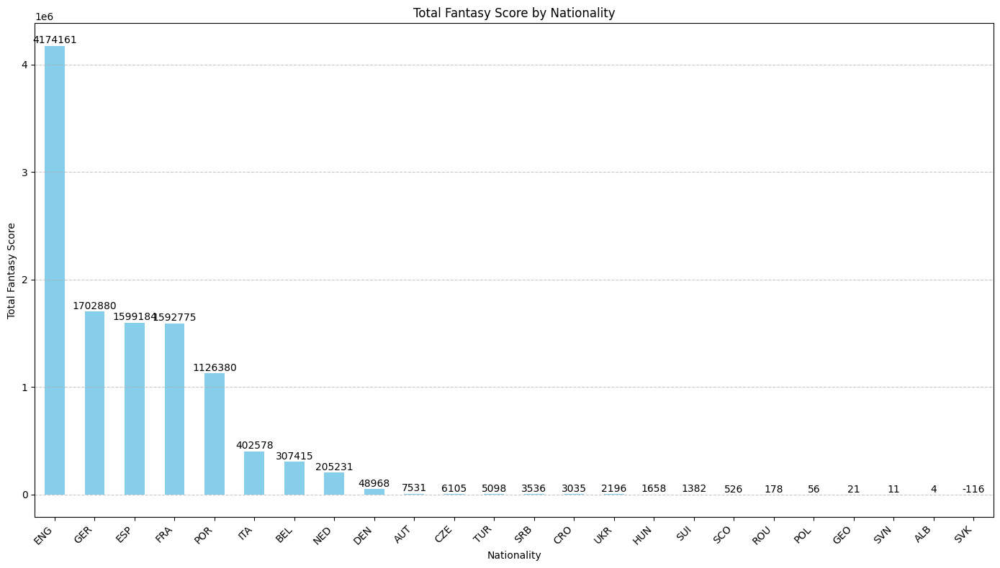

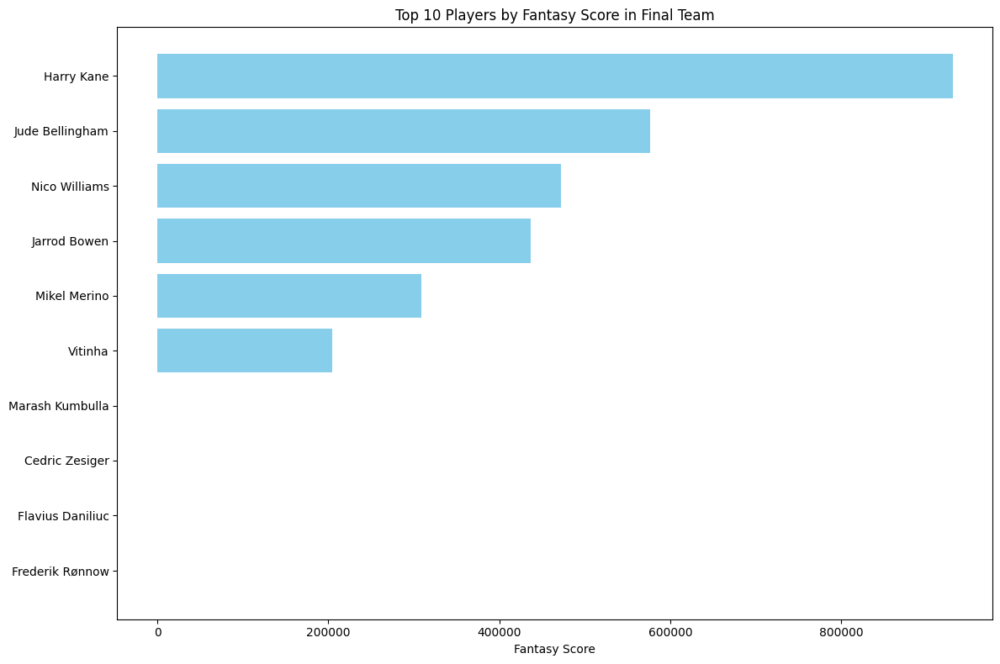

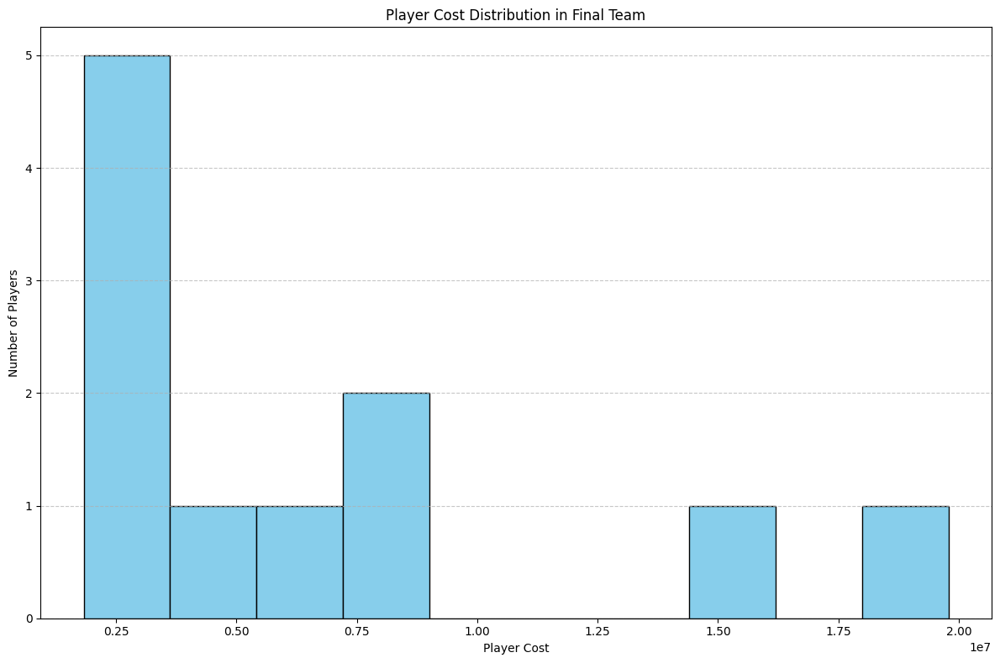

In [5]:
import matplotlib.pyplot as plt

# Group by nationality and calculate total fantasy score
nationality_scores = df_combined.groupby('nation')['fantasy_score_with_difficulty'].sum().sort_values(ascending=False)

# Plotting
plt.figure(figsize=(14, 8))
nationality_scores.plot(kind='bar', color='skyblue')
plt.title('Total Fantasy Score by Nationality')
plt.xlabel('Nationality')
plt.ylabel('Total Fantasy Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Annotate bars with values
for index, value in enumerate(nationality_scores):
    plt.text(index, value + 1000, f'{value:.0f}', ha='center', va='bottom')

# Show plot
plt.show()


# Extract the final team from the third round
final_team_data = best_formations[-1][2]

# 2. Top Players by Fantasy Score
top_players = final_team_data.nlargest(10, 'fantasy_score_with_difficulty')[['name', 'fantasy_score_with_difficulty']]

plt.figure(figsize=(12, 8))
plt.barh(top_players['name'], top_players['fantasy_score_with_difficulty'], color='skyblue')
plt.xlabel('Fantasy Score')
plt.title('Top 10 Players by Fantasy Score in Final Team')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# 3. Player Cost Distribution
plt.figure(figsize=(12, 8))
plt.hist(final_team_data['Price'], bins=10, color='skyblue', edgecolor='black')
plt.xlabel('Player Cost')
plt.ylabel('Number of Players')
plt.title('Player Cost Distribution in Final Team')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()
